# Temperature Forecast Project using ML


# Project Description

This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.


# Step 1: importing necessary libraries and load the data

In [100]:
#importing required libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression, LinearRegression,Lasso,Ridge

from sklearn.metrics import  roc_curve,roc_auc_score,r2_score
from sklearn.model_selection import train_test_split, GridSearchCV,RandomizedSearchCV
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.model_selection import train_test_split, GridSearchCV
from statsmodels.stats.outliers_influence import variance_inflation_factor
import warnings
warnings.filterwarnings('ignore')

In [101]:
#loading the dataset
temp=pd.read_csv(r'C:\Users\HP\Downloads\temperature.csv')
temp

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


These are the column given in the dataset as shown below:

1. station - used weather station number: 1 to 25
2. Date - Present day: yyyy-mm-dd ('2013-06-30' to '2017-08-30')
3. Present_Tmax - Maximum air temperature between 0 and 21 h on the present day (Â°C): 20 to 37.6
4. Present_Tmin - Minimum air temperature between 0 and 21 h on the present day (Â°C): 11.3 to 29.9
5. LDAPS_RHmin - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5
6. LDAPS_RHmax - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100
7. LDAPS_Tmax_lapse - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5
8. LDAPS_Tmin_lapse - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6
9. LDAPS_WS - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9
10. LDAPS_LH - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4
11. LDAPS_CC1 - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97
12. LDAPS_CC2 - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97
13. LDAPS_CC3 - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98
14. LDAPS_CC4 - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97
15. LDAPS_PPT1 - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7
16. LDAPS_PPT2 - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6
17. LDAPS_PPT3 - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8
18. LDAPS_PPT4 - LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7
19. lat - Latitude (Â°): 37.456 to 37.645
20. lon - Longitude (Â°): 126.826 to 127.135
21. DEM - Elevation (m): 12.4 to 212.3
22. Slope - Slope (Â°): 0.1 to 5.2
23. Solar radiation - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9
24. Next_Tmax - The next-day maximum air temperature (Â°C): 17.4 to 38.9
25. Next_Tmin - The next-day minimum air temperature (Â°C): 11.3 to 29.8T


# Step 2: Exploratory Data Analysis (EDA)

In [102]:
temp.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

In [103]:
#display the list of columns
temp.columns.tolist()

['station',
 'Date',
 'Present_Tmax',
 'Present_Tmin',
 'LDAPS_RHmin',
 'LDAPS_RHmax',
 'LDAPS_Tmax_lapse',
 'LDAPS_Tmin_lapse',
 'LDAPS_WS',
 'LDAPS_LH',
 'LDAPS_CC1',
 'LDAPS_CC2',
 'LDAPS_CC3',
 'LDAPS_CC4',
 'LDAPS_PPT1',
 'LDAPS_PPT2',
 'LDAPS_PPT3',
 'LDAPS_PPT4',
 'lat',
 'lon',
 'DEM',
 'Slope',
 'Solar radiation',
 'Next_Tmax',
 'Next_Tmin']

In [104]:
#checking null values
temp.isna().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

almost all columns have null values so i am using dropna method to remove them.

In [105]:
#dropping the null values
temp=temp.dropna()

In [106]:
temp.isnull().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

In [107]:
#Getting the normal summary and statistical information of the data
temp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7588 entries, 0 to 7749
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7588 non-null   float64
 1   Date              7588 non-null   object 
 2   Present_Tmax      7588 non-null   float64
 3   Present_Tmin      7588 non-null   float64
 4   LDAPS_RHmin       7588 non-null   float64
 5   LDAPS_RHmax       7588 non-null   float64
 6   LDAPS_Tmax_lapse  7588 non-null   float64
 7   LDAPS_Tmin_lapse  7588 non-null   float64
 8   LDAPS_WS          7588 non-null   float64
 9   LDAPS_LH          7588 non-null   float64
 10  LDAPS_CC1         7588 non-null   float64
 11  LDAPS_CC2         7588 non-null   float64
 12  LDAPS_CC3         7588 non-null   float64
 13  LDAPS_CC4         7588 non-null   float64
 14  LDAPS_PPT1        7588 non-null   float64
 15  LDAPS_PPT2        7588 non-null   float64
 16  LDAPS_PPT3        7588 non-null   float64


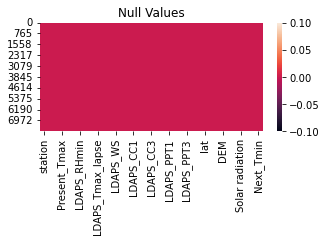

In [108]:
#Visualizing null values
plt.figure(figsize=[5,2])
sns.heatmap(temp.isna())
plt.title("Null Values")
plt.show()


In [109]:
#checking the duplicates values
temp.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
7745    False
7746    False
7747    False
7748    False
7749    False
Length: 7588, dtype: bool

In [110]:

temp.duplicated().value_counts()

False    7588
dtype: int64

yes, there is no duplicate values presented in the dataset.

In [111]:
# extracting month and date from date column in the given dataset
temp["Date"]=pd.to_datetime(temp["Date"])
temp["Month"]=temp["Date"].dt.month
temp["Day"]=temp["Date"].dt.day

In [112]:
temp.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Month,Day
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,6,30
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,6,30
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9,6,30
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3,6,30
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5,6,30


In [113]:
temp=temp.drop('Date', axis=1)

In [114]:
temp.dtypes

station             float64
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
Month                 int64
Day                   int64
dtype: object

In [115]:
temp.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Month,Day
count,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,...,7588.000000,7588.000000,7588.00000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000
mean,13.014101,29.748366,23.195809,56.724969,88.360823,29.620128,23.511786,7.094097,62.492606,0.368510,...,0.265373,37.544792,126.99142,61.918136,1.259755,5343.724208,30.241526,22.910820,7.068134,16.337375
std,7.217858,2.967401,2.400880,14.626559,7.199456,2.943496,2.342579,2.177034,33.686158,0.262260,...,1.179661,0.050428,0.07922,54.323529,1.372748,429.782561,3.111807,2.482256,2.242389,8.216880
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,0.000000,37.456200,126.82600,12.370000,0.098500,4329.520508,17.400000,11.300000,1.000000,7.000000
25%,7.000000,27.800000,21.600000,45.960243,84.203724,27.673756,22.086820,5.675358,37.206201,0.146546,...,0.000000,37.510200,126.93700,28.700000,0.271300,5001.485717,28.200000,21.300000,7.000000,8.000000
50%,13.000000,29.900000,23.400000,55.023199,89.784122,29.709537,23.758249,6.547838,56.898324,0.315706,...,0.000000,37.550700,126.99500,45.716000,0.618000,5441.987305,30.400000,23.100000,7.000000,16.000000
75%,19.000000,32.000000,24.800000,67.115099,93.742725,31.711109,25.155660,8.028960,84.235666,0.574174,...,0.000017,37.577600,127.04200,59.832400,1.767800,5729.485840,32.600000,24.600000,8.000000,24.000000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,16.655469,37.645000,127.13500,212.335000,5.178200,5992.895996,38.900000,29.800000,12.000000,31.000000


As per my observation, the value count is same in all the columns which indicates no missing data. The difference between the mean and standard devaition of each is not very less. The mean value is less than std value for LDAPS_PPT4 and slope column. The mean value is more than 50% of median in all columns so, there will skewness problem. Also we can have min, 75%, max values.

# Step 3: Visualization

# Univariate Analysis:

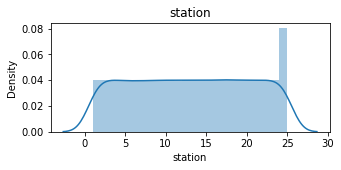

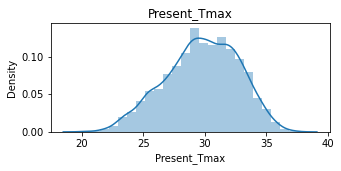

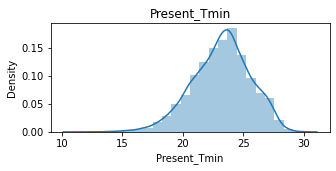

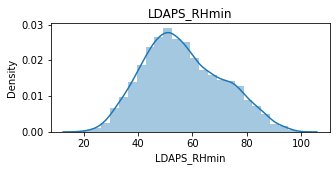

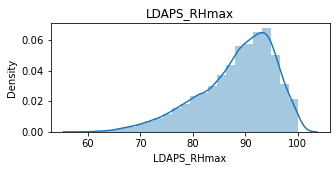

...

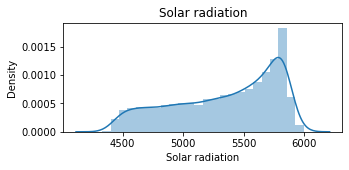

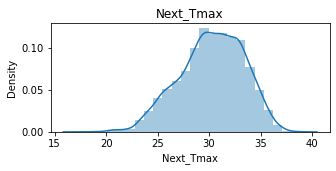

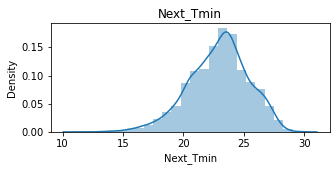

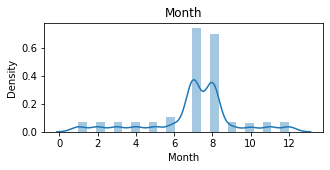

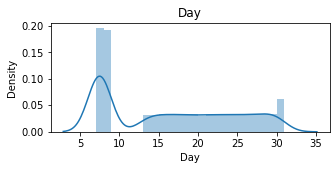

In [116]:
for k in temp.columns:              
    plt.figure(figsize = (5, 2))
    sns.distplot(temp[k], bins = 24)
    plt.title(k)
    plt.show()


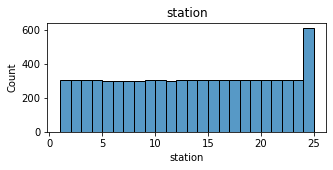

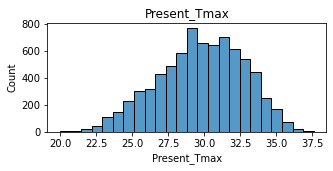

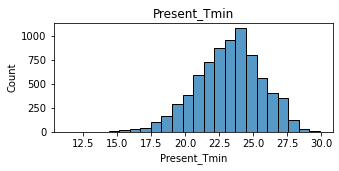

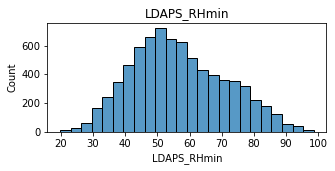

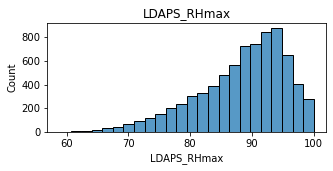

...

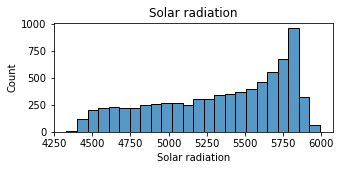

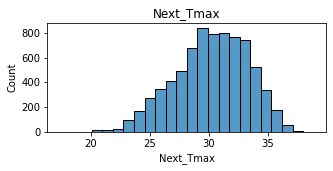

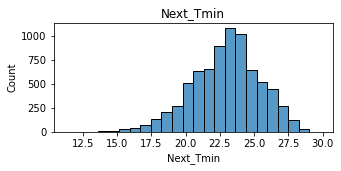

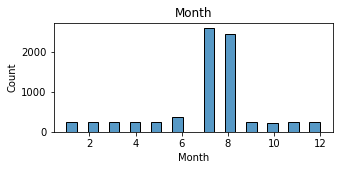

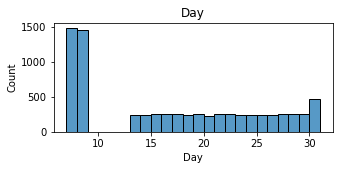

In [33]:
for k in temp.columns:              
    plt.figure(figsize = (5, 2))
    sns.histplot(temp[k], bins = 24)
    plt.title(k)
    plt.show()


# Bivariate Analysis

In [40]:
y1 = temp["Next_Tmax"]
y2 = temp["Next_Tmin"]
x = temp.drop(["Next_Tmax","Next_Tmin"], axis=1)

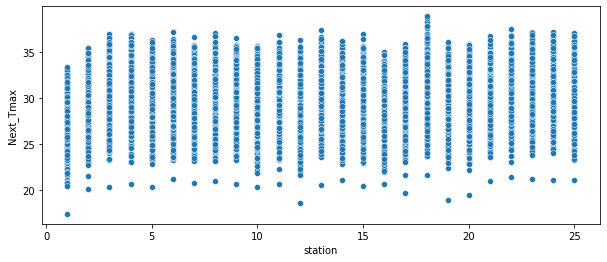

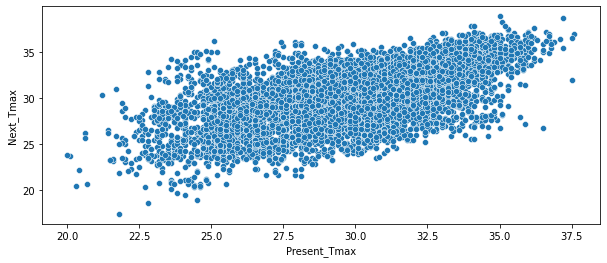

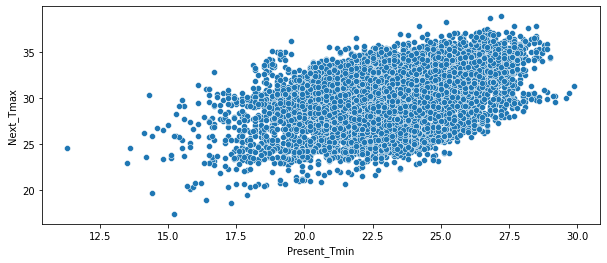

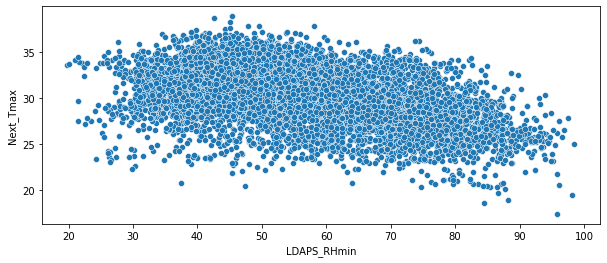

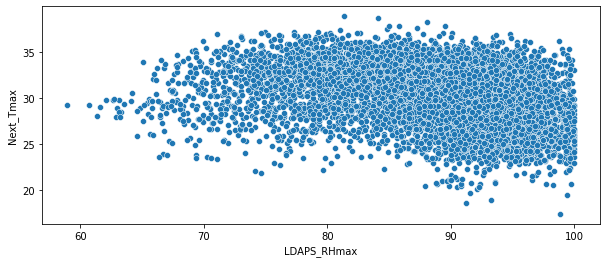

...

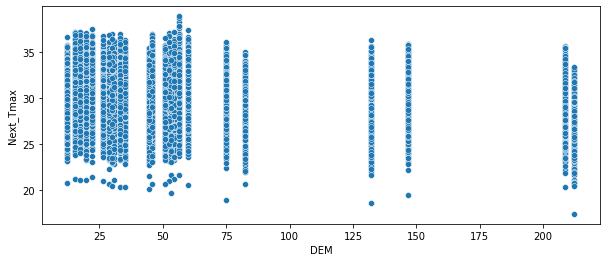

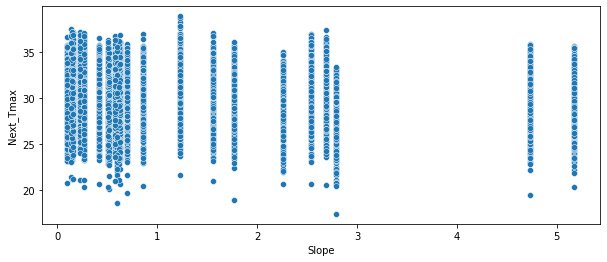

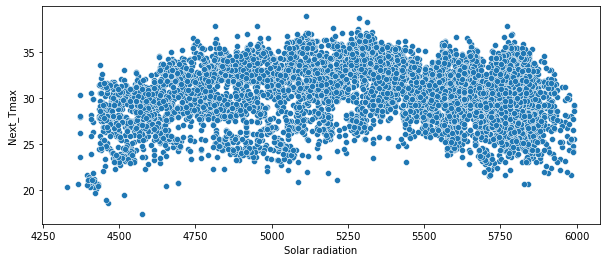

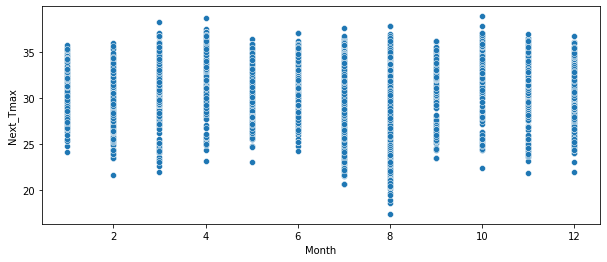

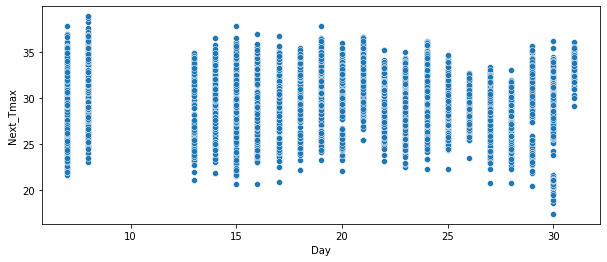

In [42]:
columns=x

for l in columns:
    plt.figure(figsize=(10,4))
    sns.scatterplot(temp[l], temp['Next_Tmax'])
    


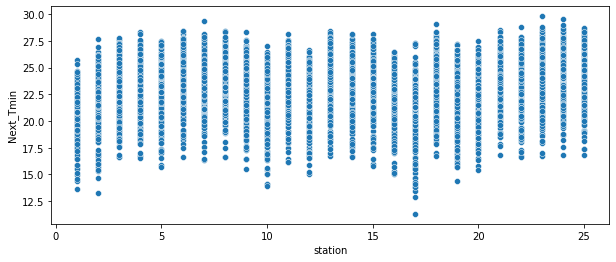

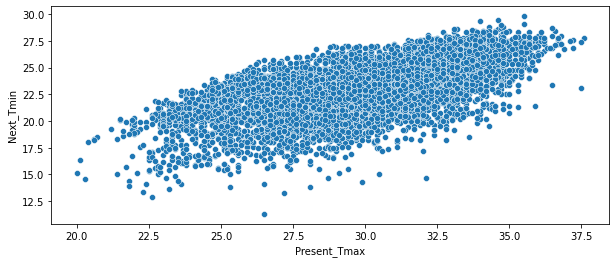

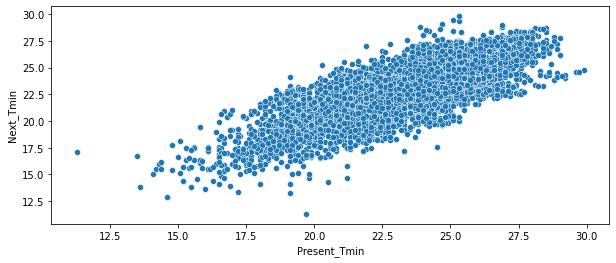

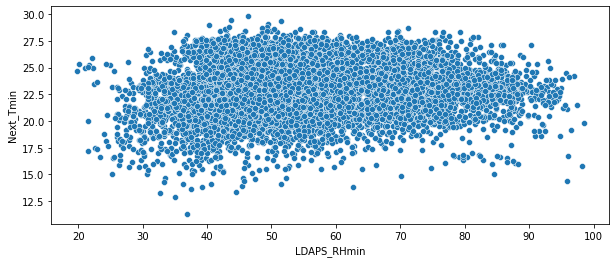

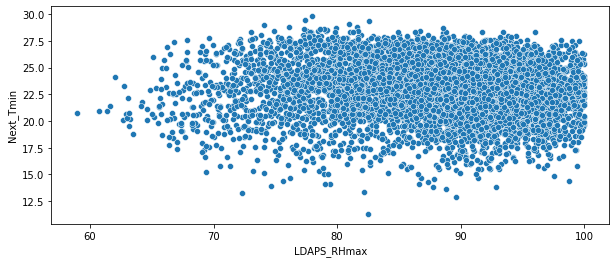

...

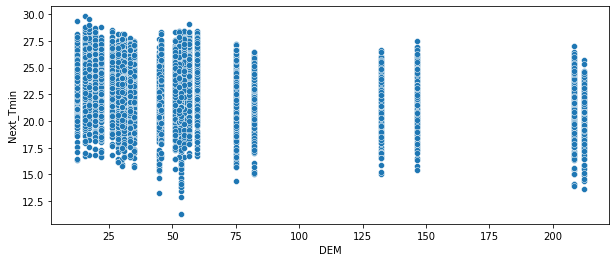

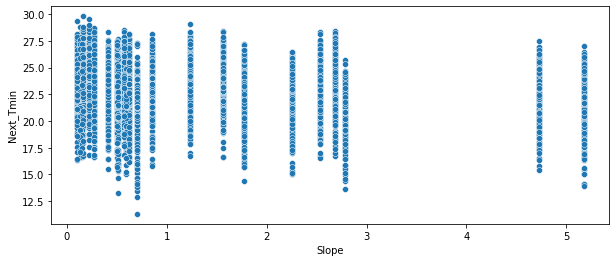

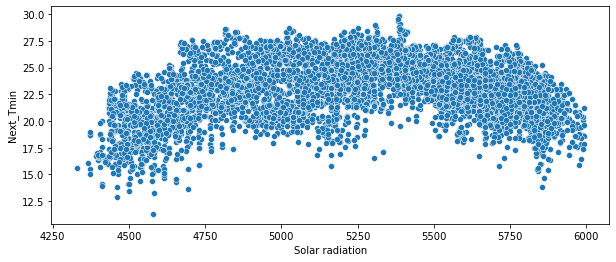

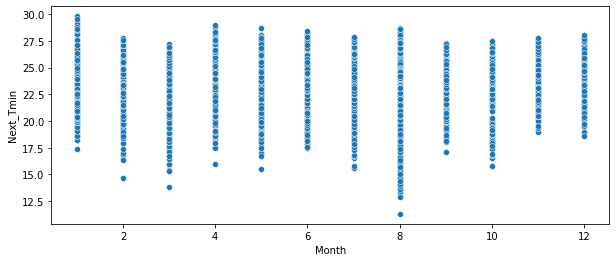

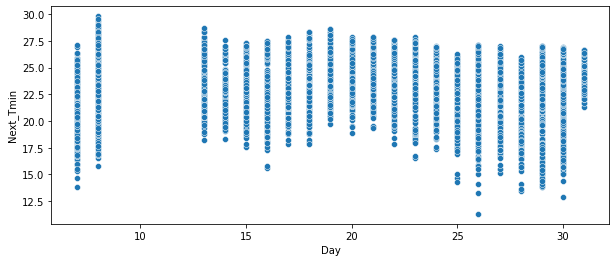

In [45]:
columns=x

for l in columns:
    plt.figure(figsize=(10,4))
    sns.scatterplot(temp[l], temp['Next_Tmin'])
    


Here we can see some of the columns are positively correlated and some are negatively correlated.

# Multivariate Analysis

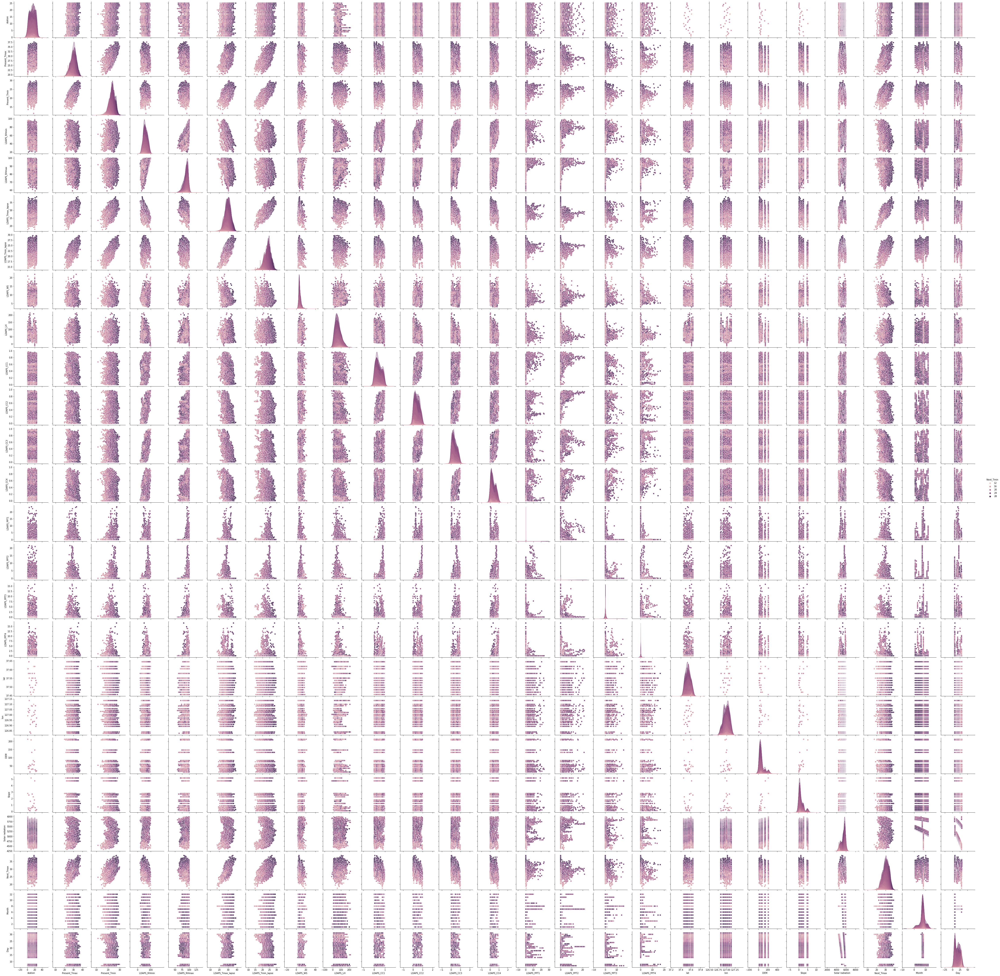

In [46]:
sns.pairplot(temp,hue='Next_Tmin')

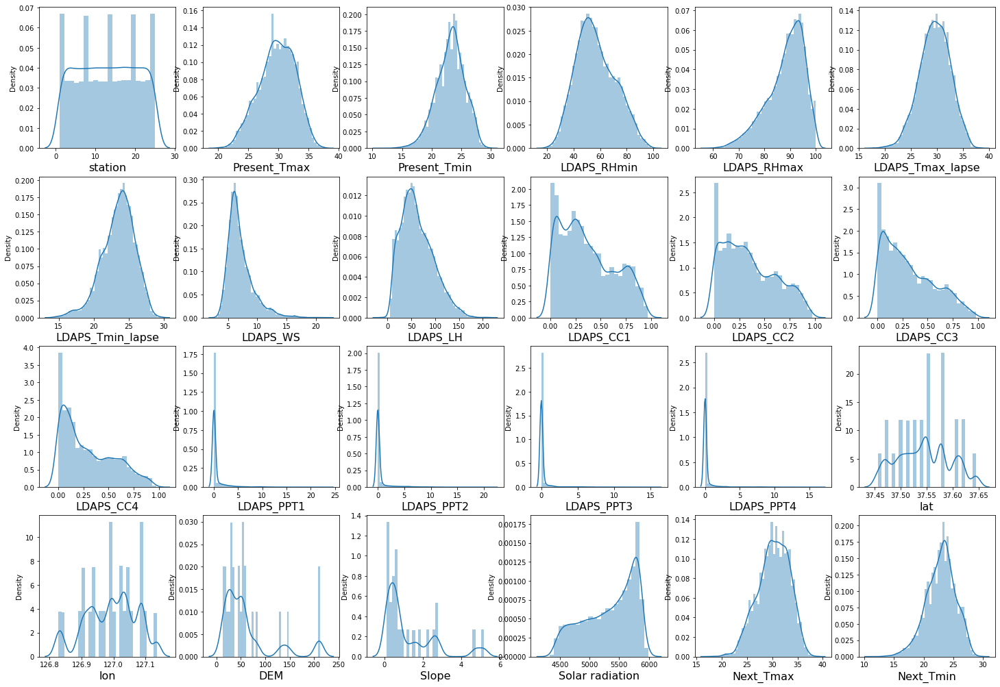

In [48]:
plt.figure(figsize=(25,22),facecolor="white")
plotnumber=1
for col in temp:
    if plotnumber<=26:
    
        ax=plt.subplot(5,6,plotnumber)
        sns.distplot(temp[col])
        plt.xlabel(col, fontsize=16)
        
    plotnumber+=1
plt.show()

<AxesSubplot:>

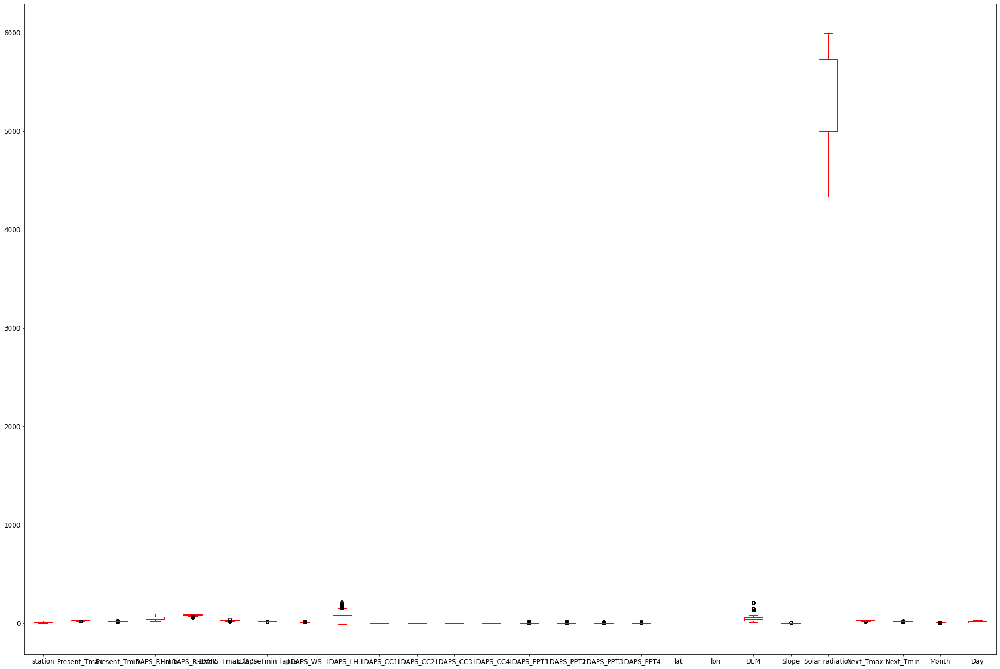

In [53]:
temp.plot(kind='box',fontsize=12,figsize=(32,22),color='r')

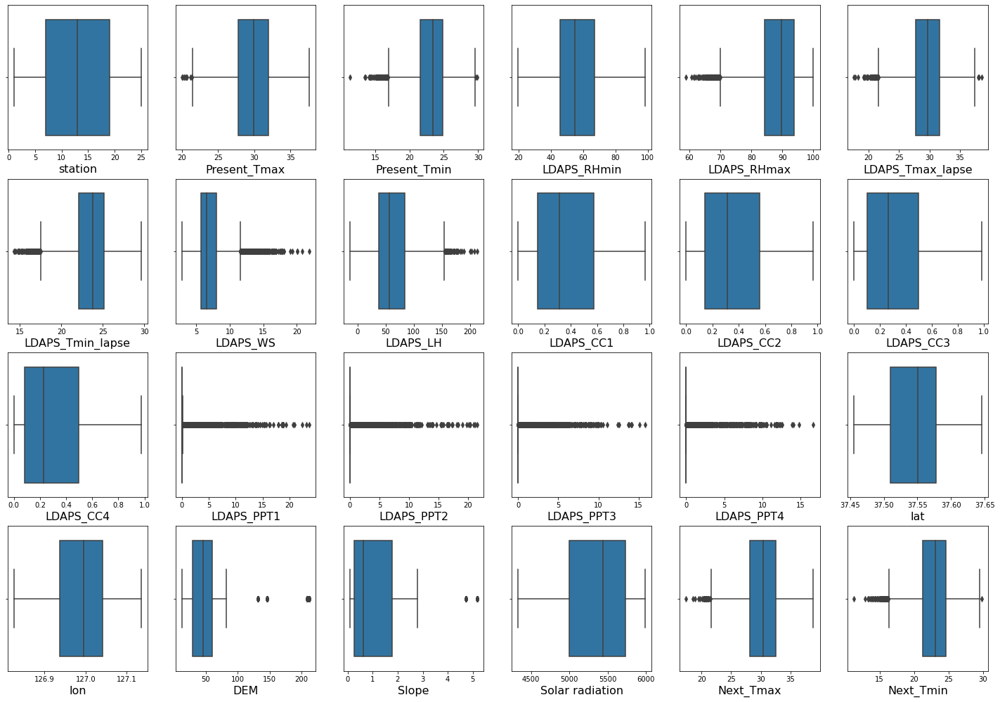

In [54]:
plt.figure(figsize=(25,22),facecolor="white")
plotnumber=1
for col in temp:
    if plotnumber<=26:
    
        ax=plt.subplot(5,6,plotnumber)
        sns.boxplot(temp[col])
        plt.xlabel(col, fontsize=16)
        
    plotnumber+=1
plt.show()

In [117]:
# removing outliers using statsmodel
from scipy import stats
from scipy.stats import zscore

z=np.abs(zscore(x))

threshold=3
np.where(z>3)
data=temp[(z<3).all(axis=1)]

In [118]:
data

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Month,Day
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,...,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,6,30
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,...,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,6,30
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,...,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9,6,30
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,...,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3,6,30
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,...,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5,6,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,23.1,17.8,24.688997,78.261383,27.812697,18.303014,6.603253,9.614074,0.052902,...,0.0,37.5507,127.040,26.2980,0.5721,4456.024414,27.6,17.7,8,30
7746,22.0,22.5,17.4,30.094858,83.690018,26.704905,17.814038,5.768083,82.146707,0.066461,...,0.0,37.5102,127.086,21.9668,0.1332,4441.803711,28.0,17.1,8,30
7747,23.0,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,0.030034,...,0.0,37.5372,126.891,15.5876,0.1554,4443.313965,28.3,18.1,8,30
7748,24.0,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,0.035874,...,0.0,37.5237,126.909,17.2956,0.2223,4438.373535,28.6,18.8,8,30


In [119]:
z

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Month,Day
0,1.664607,0.353318,0.748029,0.104660,0.382768,0.525269,0.215525,0.126423,0.206603,0.513123,...,0.275777,0.239969,0.224971,1.186076,0.005302,2.769091,1.111162,1.510565,0.476369,1.662861
1,1.526052,0.725138,0.664721,0.305052,0.311697,0.078334,0.223368,0.644133,0.313359,0.545304,...,0.275777,0.239969,0.224971,1.186076,0.512280,0.315828,0.543220,1.222997,0.476369,1.662861
2,1.387498,0.624033,0.043400,0.549344,0.609425,0.160080,0.449896,0.439100,1.244497,0.606944,...,0.275777,0.239969,0.224971,0.650626,0.840503,0.526719,0.723891,1.209602,0.476369,1.662861
3,1.248943,0.758840,0.085054,0.103573,1.128335,0.028710,0.079238,0.663353,0.096026,0.580143,...,0.275777,0.239969,0.224971,1.987268,0.386040,0.298272,0.928888,1.194265,0.476369,1.662861
4,1.110389,0.556630,0.539758,0.037665,0.249244,0.171981,0.010803,0.624327,1.349989,0.827872,...,0.275777,0.239969,0.224971,0.117159,1.812547,0.494848,0.549485,1.200286,0.476369,1.662861
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,1.106481,2.240616,2.247578,2.190405,1.402898,0.614083,2.223667,0.225479,1.569844,1.203497,...,0.275777,0.239969,0.224971,0.117159,0.613271,0.655747,0.500966,2.065599,0.415596,1.662861
7746,1.245036,2.442826,2.414195,1.820788,0.648815,0.990460,2.432415,0.609132,0.583486,1.151793,...,0.275777,0.239969,0.224971,0.686016,1.193973,0.735482,0.820711,2.098689,0.415596,1.662861
7747,1.383590,2.173212,2.539157,2.050081,1.318376,1.110333,2.021883,0.434188,0.283984,1.290699,...,0.275777,0.239969,0.224971,0.150566,1.267697,0.852919,0.804538,2.095175,0.415596,1.662861
7748,1.522145,2.173212,2.289232,2.234735,1.537141,0.886737,2.039881,0.253241,0.452772,1.268430,...,0.275777,0.239969,0.224971,0.418291,1.040466,0.821476,0.755800,2.106671,0.415596,1.662861


In [120]:
dataloss=(7588-6752)/7588*100
dataloss

11.017395888244597

In [121]:
from scipy import stats 
IQR = stats.iqr(temp) 
IQR

34.03904243575

In [122]:
Q1 = temp.quantile(0.25)
Q3 = temp.quantile(0.75)
temp_out = temp[~((temp < (Q1 - 1.5 * IQR)) |(temp> (Q3 + 1.5 * IQR))).any(axis=1)]
print(temp_out.shape)

(3698, 26)


In zscore method the dataloss is less compared with IQR method so i am considering Zscore method.

In [123]:
data.head()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Month,Day
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,...,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,6,30
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,...,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,6,30
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,...,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9,6,30
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,...,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3,6,30
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,...,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5,6,30


In [124]:

#corelation b/n features and target variable.
corr=data.corr()
corr

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Month,Day
station,1.000000,0.111032,0.134279,-0.069313,-0.175128,0.067499,0.104742,0.021791,-0.134588,0.008513,...,0.015067,-0.241215,-0.122237,-0.258197,-0.097241,-0.031800,0.107200,0.128705,0.003290,0.004470
Present_Tmax,0.111032,1.000000,0.611980,-0.151525,-0.293747,0.541375,0.617808,-0.107307,0.128330,-0.287750,...,-0.042438,-0.051572,0.010548,-0.170355,-0.092885,-0.056883,0.587642,0.614959,0.022522,-0.138131
Present_Tmin,0.134279,0.611980,1.000000,0.154390,-0.035518,0.443528,0.766265,0.016017,-0.007702,0.092447,...,-0.054603,-0.072685,-0.044517,-0.243619,-0.140201,0.024055,0.441092,0.786735,-0.020805,-0.079029
LDAPS_RHmin,-0.069313,-0.151525,0.154390,1.000000,0.553390,-0.552364,0.133667,0.235370,-0.037061,0.575085,...,0.185459,0.089862,-0.094760,0.092670,0.117326,0.252628,-0.430792,0.140048,-0.074110,-0.071063
LDAPS_RHmax,-0.175128,-0.293747,-0.035518,0.553390,1.000000,-0.383099,-0.136776,0.093281,0.272758,0.410225,...,0.106345,0.200175,0.018573,0.170304,0.216111,0.154989,-0.299136,-0.089950,-0.049553,-0.012135
LDAPS_Tmax_lapse,0.067499,0.541375,0.443528,-0.552364,-0.383099,1.000000,0.621653,-0.230788,0.034157,-0.414884,...,-0.159797,-0.038708,0.105271,-0.163897,-0.149433,0.015605,0.817272,0.552965,-0.010963,-0.141877
LDAPS_Tmin_lapse,0.104742,0.617808,0.766265,0.133667,-0.136776,0.621653,1.000000,-0.055077,-0.139865,0.040166,...,-0.079930,-0.090825,-0.026400,-0.180418,-0.174068,0.110658,0.547878,0.876574,-0.020277,-0.146103
LDAPS_WS,0.021791,-0.107307,0.016017,0.235370,0.093281,-0.230788,-0.055077,1.000000,-0.044031,0.257545,...,0.196132,-0.013724,-0.076780,0.151030,0.118629,0.133466,-0.279202,-0.016761,-0.085821,-0.056015
LDAPS_LH,-0.134588,0.128330,-0.007702,-0.037061,0.272758,0.034157,-0.139865,-0.044031,1.000000,-0.145206,...,0.038330,0.125853,0.023166,0.068716,0.100709,-0.033450,0.173076,-0.052823,-0.019383,-0.018849
LDAPS_CC1,0.008513,-0.287750,0.092447,0.575085,0.410225,-0.414884,0.040166,0.257545,-0.145206,1.000000,...,0.196232,-0.005579,-0.014165,-0.031153,-0.037264,0.243873,-0.452016,0.012337,-0.109699,-0.034039


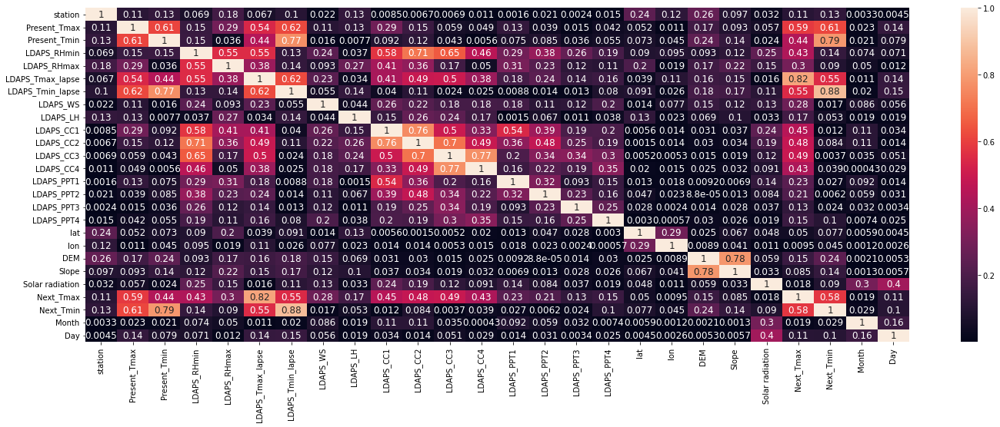

In [125]:
df_corr=data.corr().abs()
plt.figure(figsize=(24,8))
sns.heatmap(df_corr, annot=True, linecolor='blue', annot_kws={'size':12},)
plt.show()

Here Present_Tmax and Present_Tmin are highly correlated with Target variables, LDAPS_RHmin and LDAPS_RHmax are also highly correlated with target variables,and most of the columns are negatively correlated with target variables.

In [126]:
#checking the skewness
data.skew()

station            -0.002155
Present_Tmax       -0.272176
Present_Tmin       -0.228280
LDAPS_RHmin         0.310510
LDAPS_RHmax        -0.683451
LDAPS_Tmax_lapse   -0.108972
LDAPS_Tmin_lapse   -0.393491
LDAPS_WS            1.083709
LDAPS_LH            0.563986
LDAPS_CC1           0.594870
LDAPS_CC2           0.506390
LDAPS_CC3           0.703080
LDAPS_CC4           0.709748
LDAPS_PPT1          3.728629
LDAPS_PPT2          4.860127
LDAPS_PPT3          5.518685
LDAPS_PPT4          5.929500
lat                 0.104976
lon                -0.278235
DEM                 1.762057
Slope               1.588860
Solar radiation    -0.518382
Next_Tmax          -0.267742
Next_Tmin          -0.290919
Month              -0.681939
Day                 0.253976
dtype: float64

In [128]:
#Removing skewness of the data
from sklearn.preprocessing import PowerTransformer
PT=PowerTransformer()
for i in data.columns:
    if abs(data.loc[:,i].skew())>0.5:
        data.loc[:,i]=PT.fit_transform(data.loc[:,i].values.reshape(-1,1))

In [129]:
data.skew()

station            -0.002155
Present_Tmax       -0.272176
Present_Tmin       -0.228280
LDAPS_RHmin         0.310510
LDAPS_RHmax        -0.103289
LDAPS_Tmax_lapse   -0.108972
LDAPS_Tmin_lapse   -0.393491
LDAPS_WS            0.007755
LDAPS_LH           -0.031350
LDAPS_CC1           0.065359
LDAPS_CC2           0.050280
LDAPS_CC3           0.094782
LDAPS_CC4           0.142444
LDAPS_PPT1          1.617994
LDAPS_PPT2          1.822642
LDAPS_PPT3          1.996578
LDAPS_PPT4          2.268742
lat                 0.104976
lon                -0.278235
DEM                 0.038745
Slope               0.233603
Solar radiation    -0.172197
Next_Tmax          -0.267742
Next_Tmin          -0.290919
Month               0.039350
Day                 0.253976
dtype: float64

In [130]:
data=data.drop(['LDAPS_RHmin','LDAPS_RHmax','Month', 'Day'], axis=1)

In [131]:
data.shape

(6752, 22)

In [132]:
#fixing features and label

b1 = data["Next_Tmax"]
b2 = data["Next_Tmin"]
a = data.drop(["Next_Tmax","Next_Tmin"], axis=1)

In [133]:
scaler=StandardScaler()

x_scaled=scaler.fit_transform(a)
x_scaled
a=pd.DataFrame(scaler.fit_transform(a),columns=a.columns)
a

,station,Present_Tmax,Present_Tmin,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,-1.672742,-0.422834,-0.807713,-0.660123,-0.283341,0.175858,0.347804,-0.305741,-0.422965,-0.459821,-0.511365,-0.525228,-0.484314,-0.461617,-0.414275,1.209317,0.001947,1.852971,1.326620,1.889316
1,-1.533950,0.691425,-0.721339,-0.014626,0.175358,-0.575477,-0.168939,-0.346930,-0.189642,-0.473096,-0.531571,-0.525228,-0.484314,-0.461617,-0.414275,1.209317,0.517854,0.067889,-0.377165,1.430120
2,-1.395157,0.586963,0.012837,0.072794,0.412109,-0.253019,-1.379720,-0.427436,-0.162932,-0.221330,-0.441936,-0.525228,-0.484314,-0.461617,-0.414275,0.670258,0.845014,-0.355129,-0.945158,1.409613
3,-1.256365,0.726245,0.056024,-0.067694,-0.140904,-0.607648,0.243740,-0.392168,-0.313203,-0.462994,-0.490574,-0.525228,-0.484314,-0.461617,-0.414275,2.015909,0.392023,0.096946,1.247924,1.386230
4,-1.117573,0.517322,-0.591779,-0.282315,-0.069381,-0.542694,1.296123,-0.734666,-0.198012,-0.360542,-0.277066,-0.525228,-0.484314,-0.461617,-0.414275,0.133195,1.813911,-0.280536,-0.393665,1.395397
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6747,1.103102,-2.372786,-2.362440,-0.755100,-2.382111,0.047301,-2.013594,-1.335103,-1.430369,-1.604060,-1.453559,-0.525228,-0.484314,-0.461617,-0.414275,0.133195,0.618518,-0.714453,-0.270699,-1.760668
6748,1.241894,-2.581710,-2.535187,-1.157600,-2.600280,-0.517791,0.683561,-1.245834,-1.468233,-1.604055,-1.338791,-0.525228,-0.484314,-0.461617,-0.414275,-0.675394,1.197340,-1.000943,-1.354393,-1.778235
6749,1.380686,-2.303145,-2.664748,-1.285794,-2.171220,-0.245728,0.419026,-1.491018,-1.105498,-1.604060,-1.492308,-0.525228,-0.484314,-0.461617,-0.414275,-0.136335,-1.256360,-1.577569,-1.279337,-1.776379
6750,1.519478,-2.303145,-2.405627,-1.046678,-2.190031,0.010114,-0.321354,-1.450545,-1.142836,-1.604060,-1.492308,-0.525228,-0.484314,-0.461617,-0.414275,-0.405864,-1.029865,-1.398622,-1.069987,-1.782440


In [135]:
#checking multicollineraity
vif=pd.DataFrame()
vif['VIF values']=[variance_inflation_factor(a.values,i) for i in range(len(a.columns))] 

vif['features']=a.columns
vif

,VIF values,features
0,1.283888,station
1,2.487259,Present_Tmax
2,3.019024,Present_Tmin
3,4.081664,LDAPS_Tmax_lapse
4,4.791867,LDAPS_Tmin_lapse
5,1.164130,LDAPS_WS
6,1.247800,LDAPS_LH
7,4.328160,LDAPS_CC1
8,4.929533,LDAPS_CC2
9,4.255694,LDAPS_CC3


In [139]:
a=a.drop('LDAPS_CC2', axis=1)

In [140]:
#checking multicollineraity
vif=pd.DataFrame()
vif['VIF values']=[variance_inflation_factor(a.values,i) for i in range(len(a.columns))] 

vif['features']=a.columns
vif

,VIF values,features
0,1.283169,station
1,2.482975,Present_Tmax
2,3.018828,Present_Tmin
3,3.710716,LDAPS_Tmax_lapse
4,4.611446,LDAPS_Tmin_lapse
5,1.163648,LDAPS_WS
6,1.226062,LDAPS_LH
7,3.072806,LDAPS_CC1
8,3.926206,LDAPS_CC3
9,2.743327,LDAPS_CC4


now, there is no issue with multicollinearity.

# Next_Tmax

# Ridge Regression Model

# Step4: Modelling

In [141]:
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor,ExtraTreesRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.tree import DecisionTreeRegressor
from math import sqrt
from sklearn.svm import SVR

from sklearn.metrics import mean_squared_error, mean_absolute_error

In [142]:
#finding the best random state
Accu_max=0
Rs_max=0
for k in range(1,1500):
    x_train,x_test,y_train,y_test=train_test_split(a,b1, test_size=0.22, random_state=k)
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    pred=lr.predict(x_test)
    acc=r2_score(y_test, pred)
    if acc>Accu_max:
        Accu_max= acc
        Rs_max=k
print('The max r2 score is', Accu_max, 'at random state is', Rs_max)

The max r2 score is 0.7881268425138791 at random state is 477


In [143]:
#forming train_test_split
x_train,x_test,y_train,y_test=train_test_split(a,b1, test_size=0.22, random_state=477)

In [144]:
lr=LinearRegression()
lr.fit(x_train,y_train)
pred_lr=lr.predict(x_test)
pred_train=lr.predict(x_train)
print('R2_score:',r2_score(y_test,pred_lr)*100)
print('R2_score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_lr))
print('Mean Squared Error:',mean_squared_error(y_test,pred_lr))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_lr)))


R2_score: 78.8126842513879
R2_score on training data: 74.95630015480418
Mean Absolute Error: 1.0545305844298225
Mean Squared Error: 1.889668717441349
Root Mean Squared Error: 1.3746522169048245


In [145]:
rfr=RandomForestRegressor()
rfr.fit(x_train,y_train)
pred_rfr=rfr.predict(x_test)
pred_train=rfr.predict(x_train)
print('R2_score:',r2_score(y_test,pred_rfr)*100)
print('R2_score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_rfr))
print('Mean Squared Error:',mean_squared_error(y_test,pred_rfr))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_rfr)))



R2_score: 89.39367017622327
R2_score on training data: 98.2770899184929
Mean Absolute Error: 0.7430740242261101
Mean Squared Error: 0.945964553162853
Root Mean Squared Error: 0.9726070908454518


In [146]:
Dr=DecisionTreeRegressor()
Dr.fit(x_train,y_train)
pred_Dr=Dr.predict(x_test)
pred_train=Dr.predict(x_train)
print('R2_score:',r2_score(y_test,pred_Dr)*100)
print('R2_score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_Dr))
print('Mean Squared Error:',mean_squared_error(y_test,pred_Dr))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_Dr)))


R2_score: 76.60101441660692
R2_score on training data: 100.0
Mean Absolute Error: 1.0567294751009422
Mean Squared Error: 2.0869246298788693
Root Mean Squared Error: 1.444619198916749


In [147]:
sv=SVR()
sv.fit(x_train,y_train)
pred_sv=sv.predict(x_test)
pred_train=sv.predict(x_train)
print('R2_score:',r2_score(y_test,pred_sv)*100)
print('R2_score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_sv))
print('Mean Squared Error:',mean_squared_error(y_test,pred_sv))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_sv)))


R2_score: 86.433569967327
R2_score on training data: 86.26365271107319
Mean Absolute Error: 0.8285424008973686
Mean Squared Error: 1.2099719824951538
Root Mean Squared Error: 1.0999872646968027


In [148]:
tr=ExtraTreesRegressor()
tr.fit(x_train,y_train)
pred_tr=tr.predict(x_test)
pred_train=tr.predict(x_train)
print('R2_score:',r2_score(y_test,pred_tr)*100)
print('R2_score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_tr))
print('Mean Squared Error:',mean_squared_error(y_test,pred_tr))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_tr)))


R2_score: 91.42663984097655
R2_score on training data: 100.0
Mean Absolute Error: 0.6697227456258412
Mean Squared Error: 0.7646466729475098
Root Mean Squared Error: 0.8744407772671113


In [149]:
knn=KNN()
knn.fit(x_train,y_train)
pred_knn=knn.predict(x_test)
pred_train=knn.predict(x_train)
print('R2_score:',r2_score(y_test,pred_knn)*100)
print('R2_score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_knn))
print('Mean Squared Error:',mean_squared_error(y_test,pred_knn))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_knn)))


R2_score: 81.0677347419858
R2_score on training data: 86.22246271897839
Mean Absolute Error: 0.9988963660834455
Mean Squared Error: 1.6885437415881557
Root Mean Squared Error: 1.2994397799006139


In [150]:
gb=GradientBoostingRegressor()
gb.fit(x_train,y_train)
pred_gb=gb.predict(x_test)
pred_train=gb.predict(x_train)
print('R2_score:',r2_score(y_test,pred_gb)*100)
print('R2_score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_gb))
print('Mean Squared Error:',mean_squared_error(y_test,pred_gb))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_gb)))


R2_score: 84.90748213166052
R2_score on training data: 85.49721586459047
Mean Absolute Error: 0.8978044632516341
Mean Squared Error: 1.3460817416238275
Root Mean Squared Error: 1.160207628669898


In [151]:
from xgboost import XGBRegressor
xgb=XGBRegressor()
xgb.fit(x_train,y_train)
pred_xgb=xgb.predict(x_test)
pred_train=xgb.predict(x_train)
print('R2_score:',r2_score(y_test,pred_xgb)*100)
print('R2_score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_xgb))
print('Mean Squared Error:',mean_squared_error(y_test,pred_xgb))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_xgb)))


R2_score: 91.03474851194187
R2_score on training data: 98.7374009975996
Mean Absolute Error: 0.6828863033535985
Mean Squared Error: 0.7995989431595515
Root Mean Squared Error: 0.8942029653046066


In [152]:
las=Lasso()
las.fit(x_train,y_train)
pred_las=las.predict(x_test)
pred_train=las.predict(x_train)
print('R2_score:',r2_score(y_test,pred_las)*100)
print('R2_score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_las))
print('Mean Squared Error:',mean_squared_error(y_test,pred_las))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_las)))


R2_score: 55.875812379554965
R2_score on training data: 54.11681425069559
Mean Absolute Error: 1.5880011039358566
Mean Squared Error: 3.9353780355272128
Root Mean Squared Error: 1.983778726452931


In [158]:
rd=Ridge()
rd.fit(x_train,y_train)
pred_rd=rd.predict(x_test)
pred_train=rd.predict(x_train)
print('R2_score:',r2_score(y_test,pred_rd)*100)
print('R2_score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_rd))
print('Mean Squared Error:',mean_squared_error(y_test,pred_rd))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_rd)))


R2_score: 78.81254473576199
R2_score on training data: 74.95629758620639
Mean Absolute Error: 1.0545484153246607
Mean Squared Error: 1.8896811606558188
Root Mean Squared Error: 1.3746567428473986


# Crossvalidation

In [154]:
from sklearn.model_selection import cross_val_score

In [160]:
score=cross_val_score(lr, a,b1)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is- ", r2_score(y_test, pred_lr)-score.mean() )

[0.74599265 0.65917677 0.67569381 0.74415013 0.66031175]
0.6970650232303834
Difference between R2 score and cross validation score is-  0.09106181928349566


In [163]:
score=cross_val_score(rfr, a,b1)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is- ", r2_score(y_test, pred_rfr)-score.mean() )

[0.72045918 0.65805916 0.63616596 0.70011893 0.61491677]
0.6659439989340172
Difference between R2 score and cross validation score is-  0.22799270282821538


In [165]:
score=cross_val_score(Dr, a,b1)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is- ", r2_score(y_test, pred_Dr)-score.mean() )

[0.33852283 0.33664107 0.37894086 0.48475729 0.39756428]
0.3872852678282822
Difference between R2 score and cross validation score is-  0.37872487633778695


In [166]:
score=cross_val_score(tr, a,b1)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is- ", r2_score(y_test, pred_tr)-score.mean() )


[0.70579738 0.63999218 0.66358462 0.71145235 0.63082307]
0.6703299178002884
Difference between R2 score and cross validation score is-  0.24393648060947704


In [169]:
score=cross_val_score(xgb, a,b1)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is- ", r2_score(y_test, pred_xgb)-score.mean() )

[0.67878707 0.63690232 0.62740416 0.6822953  0.61745262]
0.6485682920577033
Difference between R2 score and cross validation score is-  0.2617791930617155


In [171]:
score=cross_val_score(rd, a,b1)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is- ", r2_score(y_test, pred_rd)-score.mean() )

[0.74601785 0.65916962 0.67569447 0.7441573  0.66033493]
0.6970748329654877
Difference between R2 score and cross validation score is-  0.09105061439213225


Here i am considering ridge model which less score.

# STEP 5:Hyperparameter tuning

In [190]:
#import the Grid search CV
grid_param={'max_iter' :range(10,20),
              'random_state':range(24,34),
              'solver' : [ 'auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga'],
           'alpha': range(10,20),'copy_X': [True]}



In [191]:
grid_search=GridSearchCV(estimator=rd,
                        param_grid=grid_param,
                        cv=5,
                         n_jobs=-1)
grid_search.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=Ridge(), n_jobs=-1,
             param_grid={'alpha': range(10, 20), 'copy_X': [True],
                         'max_iter': range(10, 20),
                         'random_state': range(24, 34),
                         'solver': ['auto', 'svd', 'cholesky', 'lsqr',
                                    'sparse_cg', 'sag', 'saga']})

In [192]:
best_parameters=grid_search.best_params_
print(best_parameters)

{'alpha': 10, 'copy_X': True, 'max_iter': 15, 'random_state': 27, 'solver': 'sag'}


In [269]:
final_model=Ridge( alpha=0.01,copy_X=True, max_iter=9, random_state=37, solver='sag')
final_model.fit(x_train,y_train)
final_model.score(x_test,y_test)

0.7888963971917741

In [270]:
pred=final_model.predict(x_test)
print('R2_score:',r2_score(y_test,pred)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred))
print('Mean Squared Error:',mean_squared_error(y_test,pred))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred)))


R2_score: 78.88963971917741
Mean Absolute Error: 1.052037746432734
Mean Squared Error: 1.882805160875558
Root Mean Squared Error: 1.3721534756999882


# Step6: Save the model

In [273]:
#saving my model
import pickle

filename='Temperature forecast for Next_Tmax prediction'
pickle.dump(rd, open(filename,'wb'))


In [274]:
import pickle
loaded_model=pickle.load(open('Temperature forecast for Next_Tmax prediction','rb'))
result=loaded_model.score(x_test,y_test)
print(result*100)

78.81254473576199


In [275]:
conclusion=pd.DataFrame([loaded_model.predict(x_test)[:],y_test[:]],index=['original','predicted'])
conclusion

,0,1,2,3,4,5,6,7,8,9,...,1476,1477,1478,1479,1480,1481,1482,1483,1484,1485
original,33.626861,31.570453,28.695594,29.767671,32.823892,31.805963,32.534507,33.958114,33.82909,33.040741,...,28.341674,30.572294,31.468921,26.836265,33.079379,32.71122,29.054343,28.788812,31.596175,28.351008
predicted,34.000000,32.000000,28.400000,28.900000,31.800000,31.900000,33.000000,35.600000,35.40000,32.200000,...,29.200000,26.900000,31.200000,26.500000,33.200000,32.70000,29.800000,25.900000,29.900000,29.300000


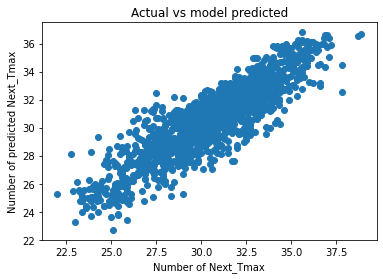

In [276]:
#plotting between actual and predicted score
plt.scatter(y_test,pred)
plt.xlabel('Number of Next_Tmax')
plt.ylabel('Number of predicted Next_Tmax')
plt.title('Actual vs model predicted')
plt.show()

# Next_Tmi

# Ridge Regression Model

# Step1: Modelling

In [277]:
#finding the best random state
Accu_max=0
Rs_max=0
for k in range(1,1500):
    x_train,x_test,y_train,y_test=train_test_split(a,b2, test_size=0.22, random_state=k)
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    pred=lr.predict(x_test)
    acc=r2_score(y_test, pred)
    if acc>Accu_max:
        Accu_max= acc
        Rs_max=k
print('The max r2 score is', Accu_max, 'at random state is', Rs_max)

The max r2 score is 0.8383057007443717 at random state is 481


In [278]:
#forming train_test_split
x_train,x_test,y_train,y_test=train_test_split(a,b2, test_size=0.22, random_state=481)

In [279]:
lr=LinearRegression()
lr.fit(x_train,y_train)
pred_lr=lr.predict(x_test)
pred_train=lr.predict(x_train)
print('R2_score:',r2_score(y_test,pred_lr)*100)
print('R2_score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_lr))
print('Mean Squared Error:',mean_squared_error(y_test,pred_lr))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_lr)))


R2_score: 83.83057007443718
R2_score on training data: 80.98399951012006
Mean Absolute Error: 0.7693321317653672
Mean Squared Error: 0.9578324281174349
Root Mean Squared Error: 0.9786891376312679


In [280]:
rfr=RandomForestRegressor()
rfr.fit(x_train,y_train)
pred_rfr=rfr.predict(x_test)
pred_train=rfr.predict(x_train)
print('R2_score:',r2_score(y_test,pred_rfr)*100)
print('R2_score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_rfr))
print('Mean Squared Error:',mean_squared_error(y_test,pred_rfr))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_rfr)))



R2_score: 90.83047829942204
R2_score on training data: 98.488894746911
Mean Absolute Error: 0.5694865410497985
Mean Squared Error: 0.5431771729475109
Root Mean Squared Error: 0.737005544719652


In [281]:
Dr=DecisionTreeRegressor()
Dr.fit(x_train,y_train)
pred_Dr=Dr.predict(x_test)
pred_train=Dr.predict(x_train)
print('R2_score:',r2_score(y_test,pred_Dr)*100)
print('R2_score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_Dr))
print('Mean Squared Error:',mean_squared_error(y_test,pred_Dr))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_Dr)))


R2_score: 79.7628081554361
R2_score on training data: 100.0
Mean Absolute Error: 0.8065275908479138
Mean Squared Error: 1.1987954239569312
Root Mean Squared Error: 1.094895165738223


In [282]:
tr=ExtraTreesRegressor()
tr.fit(x_train,y_train)
pred_tr=tr.predict(x_test)
pred_train=tr.predict(x_train)
print('R2_score:',r2_score(y_test,pred_tr)*100)
print('R2_score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_tr))
print('Mean Squared Error:',mean_squared_error(y_test,pred_tr))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_tr)))


R2_score: 91.44696361522941
R2_score on training data: 100.0
Mean Absolute Error: 0.543883580080754
Mean Squared Error: 0.5066582833109021
Root Mean Squared Error: 0.7117993279786812


In [283]:
knn=KNN()
knn.fit(x_train,y_train)
pred_knn=knn.predict(x_test)
pred_train=knn.predict(x_train)
print('R2_score:',r2_score(y_test,pred_knn)*100)
print('R2_score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_knn))
print('Mean Squared Error:',mean_squared_error(y_test,pred_knn))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_knn)))


R2_score: 84.75093553642597
R2_score on training data: 89.26645221796785
Mean Absolute Error: 0.7409690444145358
Mean Squared Error: 0.903312516823688
Root Mean Squared Error: 0.9504275442261172


In [284]:
gb=GradientBoostingRegressor()
gb.fit(x_train,y_train)
pred_gb=gb.predict(x_test)
pred_train=gb.predict(x_train)
print('R2_score:',r2_score(y_test,pred_gb)*100)
print('R2_score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_gb))
print('Mean Squared Error:',mean_squared_error(y_test,pred_gb))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_gb)))


R2_score: 89.44327448446154
R2_score on training data: 89.59826219308637
Mean Absolute Error: 0.6264088710208254
Mean Squared Error: 0.6253513005756456
Root Mean Squared Error: 0.790791565822275


In [285]:
from xgboost import XGBRegressor
xgb=XGBRegressor()
xgb.fit(x_train,y_train)
pred_xgb=xgb.predict(x_test)
pred_train=xgb.predict(x_train)
print('R2_score:',r2_score(y_test,pred_xgb)*100)
print('R2_score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_xgb))
print('Mean Squared Error:',mean_squared_error(y_test,pred_xgb))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_xgb)))


R2_score: 93.29807278885646
R2_score on training data: 99.02478012594663
Mean Absolute Error: 0.48965105144043797
Mean Squared Error: 0.3970036818408418
Root Mean Squared Error: 0.6300822818020213


In [286]:
las=Lasso()
las.fit(x_train,y_train)
pred_las=las.predict(x_test)
pred_train=las.predict(x_train)
print('R2_score:',r2_score(y_test,pred_las)*100)
print('R2_score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_las))
print('Mean Squared Error:',mean_squared_error(y_test,pred_las))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_las)))


R2_score: 60.70763884942528
R2_score on training data: 58.80309030756352
Mean Absolute Error: 1.216690455712472
Mean Squared Error: 2.3275710931418088
Root Mean Squared Error: 1.5256379298974605


In [287]:
rd=Ridge()
rd.fit(x_train,y_train)
pred_rd=rd.predict(x_test)
pred_train=rd.predict(x_train)
print('R2_score:',r2_score(y_test,pred_rd)*100)
print('R2_score on training data:',r2_score(y_train, pred_train)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred_rd))
print('Mean Squared Error:',mean_squared_error(y_test,pred_rd))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred_rd)))


R2_score: 83.830269403293
R2_score on training data: 80.98399342480582
Mean Absolute Error: 0.7693393110865322
Mean Squared Error: 0.9578502390466646
Root Mean Squared Error: 0.9786982369692225


# Crossvalidation

In [288]:
score=cross_val_score(lr, a,b2)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is- ", r2_score(y_test, pred_lr)-score.mean() )

[0.70447572 0.64588002 0.79313467 0.84615141 0.84108595]
0.766145553830955
Difference between R2 score and cross validation score is-  0.07216014691341677


In [289]:
score=cross_val_score(tr, a,b2)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is- ", r2_score(y_test, pred_tr)-score.mean() )

[0.71627164 0.69026904 0.81122861 0.8570021  0.85925546]
0.7868053709327911
Difference between R2 score and cross validation score is-  0.12766426521950291


In [290]:
score=cross_val_score(rfr, a,b2)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is- ", r2_score(y_test, pred_rfr)-score.mean() )

[0.70343166 0.6943428  0.80569111 0.85321008 0.83960553]
0.7792562371201261
Difference between R2 score and cross validation score is-  0.1290485458740942


In [291]:
score=cross_val_score(xgb, a,b2)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is- ", r2_score(y_test, pred_xgb)-score.mean() )

[0.66537743 0.66775276 0.80511636 0.84230497 0.85438356]
0.7669870169047288
Difference between R2 score and cross validation score is-  0.16599371098383575


In [292]:
score=cross_val_score(Dr, a,b2)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is- ", r2_score(y_test, pred_Dr)-score.mean() )

[0.41237657 0.47319485 0.61514123 0.74342934 0.67326915]
0.5834822283225087
Difference between R2 score and cross validation score is-  0.2141458532318523


In [293]:
score=cross_val_score(rd, a,b2)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is- ", r2_score(y_test, pred_rd)-score.mean() )

[0.70448734 0.64589998 0.79310845 0.84616516 0.84110257]
0.7661526991050019
Difference between R2 score and cross validation score is-  0.07214999492792806


Here i am considering ridge as it has less score comparing to others

# Step2: Hyperparameter Tuning

In [294]:
#import the Grid search CV

grid_param={'max_iter' :range(10,20),
              'random_state':range(24,34),
              'solver' : [ 'auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga'],
           'alpha': range(10,20),'copy_X': [True]}



In [295]:
rd.get_params()
grid_search=GridSearchCV(estimator=rd,
                        param_grid=grid_param,
                        cv=5,
                         n_jobs=-1)
grid_search.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=Ridge(), n_jobs=-1,
             param_grid={'alpha': range(10, 20), 'copy_X': [True],
                         'max_iter': range(10, 20),
                         'random_state': range(24, 34),
                         'solver': ['auto', 'svd', 'cholesky', 'lsqr',
                                    'sparse_cg', 'sag', 'saga']})

In [296]:
grid_search.best_params_

{'alpha': 10,
 'copy_X': True,
 'max_iter': 12,
 'random_state': 26,
 'solver': 'sag'}

In [330]:
final_model=Ridge( alpha=0.001,copy_X=True, max_iter=11, random_state=37, solver='sag')
final_model.fit(x_train,y_train)
final_model.score(x_test,y_test)

0.8385554099193799

In [331]:
pred=final_model.predict(x_test)
print('R2_score:',r2_score(y_test,pred)*100)
print('Mean Absolute Error:',mean_absolute_error(y_test,pred))
print('Mean Squared Error:',mean_squared_error(y_test,pred))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred)))


R2_score: 83.855540991938
Mean Absolute Error: 0.7682276561118339
Mean Squared Error: 0.9563532198427928
Root Mean Squared Error: 0.9779331366932981


By the tuning the parameters the model  score is very slightly increased.

# Step3: Save the model

In [337]:
#saving my model
import pickle

filename='Temperature forecast for Next_Tmin prediction'
pickle.dump(rd, open(filename,'wb'))


In [338]:
import pickle
loaded_model=pickle.load(open('Temperature forecast for Next_Tmin prediction','rb'))
result=loaded_model.score(x_test,y_test)
print(result*100)

83.830269403293


In [339]:
conclusion=pd.DataFrame([loaded_model.predict(x_test)[:],y_test[:]],index=['original','predicted'])
conclusion

,0,1,2,3,4,5,6,7,8,9,...,1476,1477,1478,1479,1480,1481,1482,1483,1484,1485
original,24.706259,24.812934,25.651091,21.269097,24.479455,19.29778,21.749768,21.595638,20.489715,19.788741,...,25.14637,17.064299,23.338564,19.346597,18.941059,23.67714,22.745206,23.310358,20.213524,21.724672
predicted,23.200000,23.300000,25.400000,23.000000,26.000000,19.60000,20.500000,21.000000,21.000000,18.900000,...,26.20000,15.400000,20.900000,21.700000,19.500000,23.80000,22.800000,23.200000,19.500000,21.100000


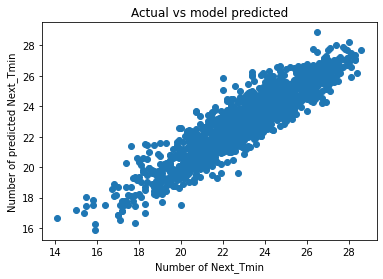

In [340]:
#plotting between actual and predicted score
plt.scatter(y_test,pred)
plt.xlabel('Number of Next_Tmin')
plt.ylabel('Number of predicted Next_Tmin')
plt.title('Actual vs model predicted')
plt.show()

Yes, sucessfully done.